**Test Batcher:**

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

  0%|          | 0/991 [00:00<?, ?it/s]

Found 9 missing train files
Got 991 train picture filenames
Got 991 train picture labels
Read filenames took 0.90 s
Percentage to load = 991/991 (100%)
Preloading...


100%|██████████| 991/991 [00:42<00:00, 23.22it/s]

Preload took 42.69 s


tensor(13224) tensor(11990) tensor(9708) tensor(3324) tensor(10339) tensor(5369) tensor(3547) tensor(11676) tensor(6051) tensor(3918) tensor(13320) tensor(7337) tensor(5985) tensor(13973) tensor(8896) tensor(8160)


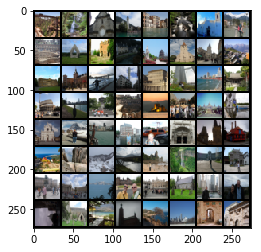

In [2]:

import sys
sys.path.insert(0, './code')

from batcher import run_test

run_test()

**Anlysis Train.csv**

In [4]:
import os.path as osp
from tqdm import tqdm
import csv

In [5]:
path = '/home/gangwu/landmarks-data/landmarks-data'

In [50]:
def getLabelMap():
    with open('./data/train.csv') as csvfile:
        readCSV = csv.reader(csvfile, delimiter=',')
        labelMap = {}
        uniqueLabelList = []
        labelList = []
        missingFiles = 0
        totalFiles = 0
        first = True
        for row in tqdm(readCSV):
            if first:
                first = False
                continue # skip table head
            baseName = row[0]
            label = row[2]
            fName = path + '/train/' + baseName + '.jpg'
            if label in labelMap.keys():
                labelMap[label].append(fName)
            else:
                labelMap[label] = list([fName])
                uniqueLabelList.append(int(label))
            labelList.append(int(label))
            '''
            if osp.isfile(fName):
                if label in labelMap.keys():
                    labelMap[label].append(fName)
                else:
                    labelMap[label] = list(fName)
            else:
                missingFiles = missingFiles + 1
            '''
            totalFiles += 1
        print('Found %d missing train files' % missingFiles)
        print('Got %d train files' % totalFiles)
        print('Got %d unique labels' % len(labelMap))
        return labelMap, labelList, uniqueLabelList

In [51]:
labelMap, labelList, uniqueLabelList = getLabelMap()

1225030it [00:06, 195381.66it/s]


Found 0 missing train files
Got 1225029 train files
Got 14951 unique labels


**Ranges of the label (hash values)**

In [8]:
uniqueLabelList.sort()
print('max label value: %d' % uniqueLabelList[-1])
print('min label value: %d' % uniqueLabelList[0])

max label value: 14950
min label value: 0


In [52]:
maxDataLabel = 0
minDataLabel = 0

maxLen = 0
minLen = 99999

tpList = []

for k in labelMap.keys():
    dataLen = len(labelMap[k])
    tpList.append((int(k), dataLen))
    '''
    if dataLen > maxLen:
        maxDataLabel = int(k)
        maxLen = dataLen
    elif dataLen < minLen:
        minDataLabel = int(k)
        minLen = dataLen
    '''

tpList.sort(key=lambda tup: tup[1])

print('min data in class: %d with class label: %d' % (tpList[-1][1], tpList[-1][0]))
print('max data in class: %d with class label: %d' % (tpList[0][1], tpList[0][0]))

min data in class: 50337 with class label: 9633
max data in class: 1 with class label: 12452


Label very frequent:

In [34]:
s = 0
for e in reversed(tpList):
    print('size: %d, label: %d' % (e[1], e[0]))
    s += 1
    if s > 10:
        break

size: 50405, label: 9633
size: 50216, label: 6051
size: 23483, label: 6599
size: 18539, label: 9779
size: 13339, label: 2061
size: 11215, label: 5554
size: 9576, label: 6651
size: 9290, label: 6696
size: 9284, label: 5376
size: 9065, label: 2743
size: 9061, label: 4352


Write 200 most frequent classes, each class get 600 images

In [71]:
import re

def getBaseFileName(fileName):
    match = re.search("train/(\S+)\.jpg", fileName)
    if match:
        return match.group(1)
    return 'Error'

In [78]:
import os

s = 0
with open('./tiny_landmarks.csv', 'w') as f1:
    for e in reversed(tpList):
        print('classIdx: %d, size: %d, label: %d' % (s, e[1], e[0]))
        label = e[0]
        fileList = labelMap[str(label)]
        cnt = 0
        for fn in fileList:
            if osp.isfile(fn):
                os.system('mkdir /home/gangwu/projects/landmarks/data/tiny-landmarks/train/'+str(label))
                os.system('cp ' + fn + ' /home/gangwu/projects/landmarks/data/tiny-landmarks/train/'+str(label)+'/')
                f1.write('%s, %s, %d\n' % (getBaseFileName(fn), fn, label))
                cnt+=1
                if cnt % 50 == 0:
                    print(str(cnt) + ' ',end='') 
            if cnt > 599:
                print('')
                break
        s += 1
        if s > 199:
            break
f1.closed

classIdx: 0, size: 50337, label: 9633
50 100 150 200 250 300 350 400 450 500 550 600 
classIdx: 1, size: 50148, label: 6051
50 100 150 200 250 300 350 400 450 500 550 600 
classIdx: 2, size: 23415, label: 6599
50 100 150 200 250 300 350 400 450 500 550 600 
classIdx: 3, size: 18471, label: 9779
50 100 150 200 250 300 350 400 450 500 550 600 
classIdx: 4, size: 13271, label: 2061
50 100 150 200 250 300 350 400 450 500 550 600 
classIdx: 5, size: 11147, label: 5554
50 100 150 200 250 300 350 400 450 500 550 600 
classIdx: 6, size: 9508, label: 6651
50 100 150 200 250 300 350 400 450 500 550 600 
classIdx: 7, size: 9222, label: 6696
50 100 150 200 250 300 350 400 450 500 550 600 
classIdx: 8, size: 9216, label: 5376
50 100 150 200 250 300 350 400 450 500 550 600 
classIdx: 9, size: 8997, label: 2743
50 100 150 200 250 300 350 400 450 500 550 600 
classIdx: 10, size: 8993, label: 4352
50 100 150 200 250 300 350 400 450 500 550 600 
classIdx: 11, size: 8667, label: 13526
50 100 150 200 250 

KeyboardInterrupt: 

Label not very frequent:

In [24]:
s = 0
for e in tpList:
    print('class: %d, label: %d' % (e[1], e[0]))
    s += 1
    if s > 10:
        break

class: 69, label: 12452
class: 69, label: 320
class: 69, label: 8232
class: 69, label: 6423
class: 69, label: 9860
class: 69, label: 1120
class: 69, label: 10535
class: 69, label: 7596
class: 69, label: 10275
class: 69, label: 7815
class: 69, label: 13342


In [3]:
from batcher import showDataInClass

1648it [00:13, 123.32it/s]


Got 64 train picture files with class 9633


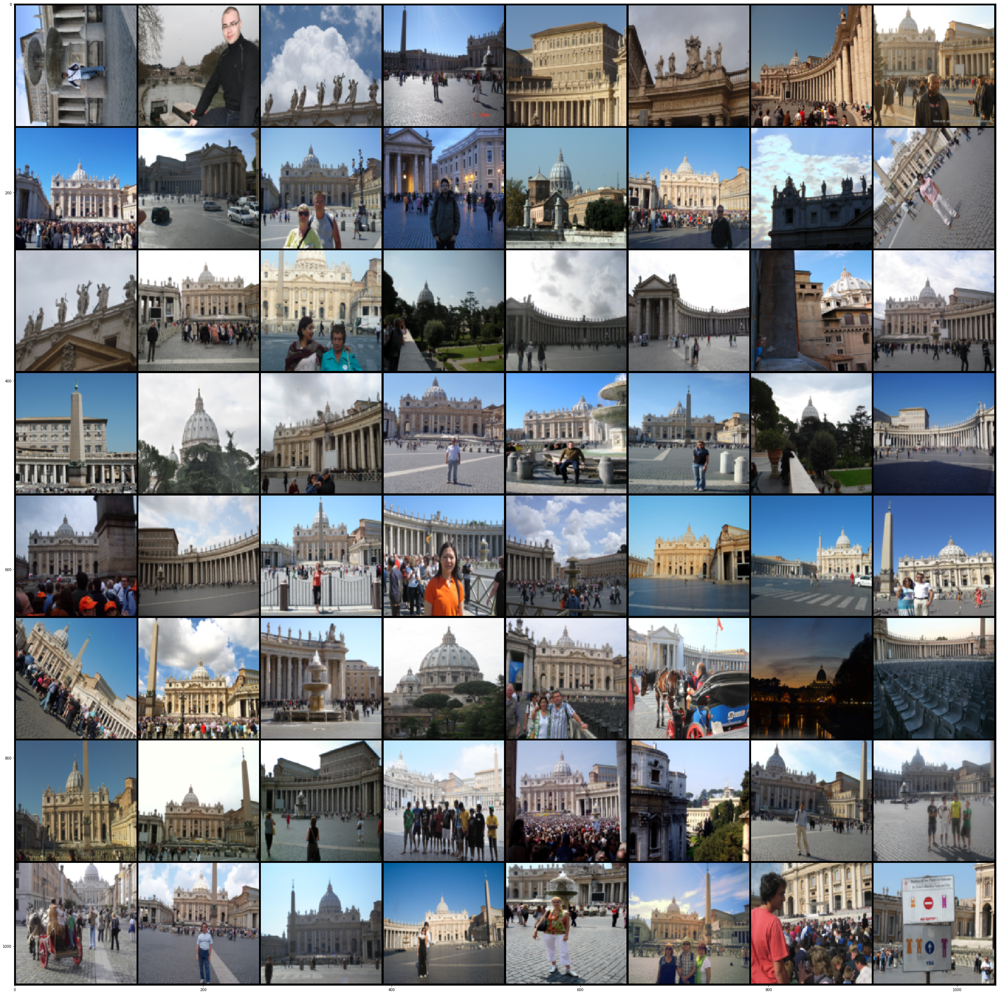

In [20]:
showDataInClass(9633)

The one with most pictures happens to be St. Peter's Square !!!

1989it [00:24, 79.88it/s]


Got 64 train picture files with class 6051


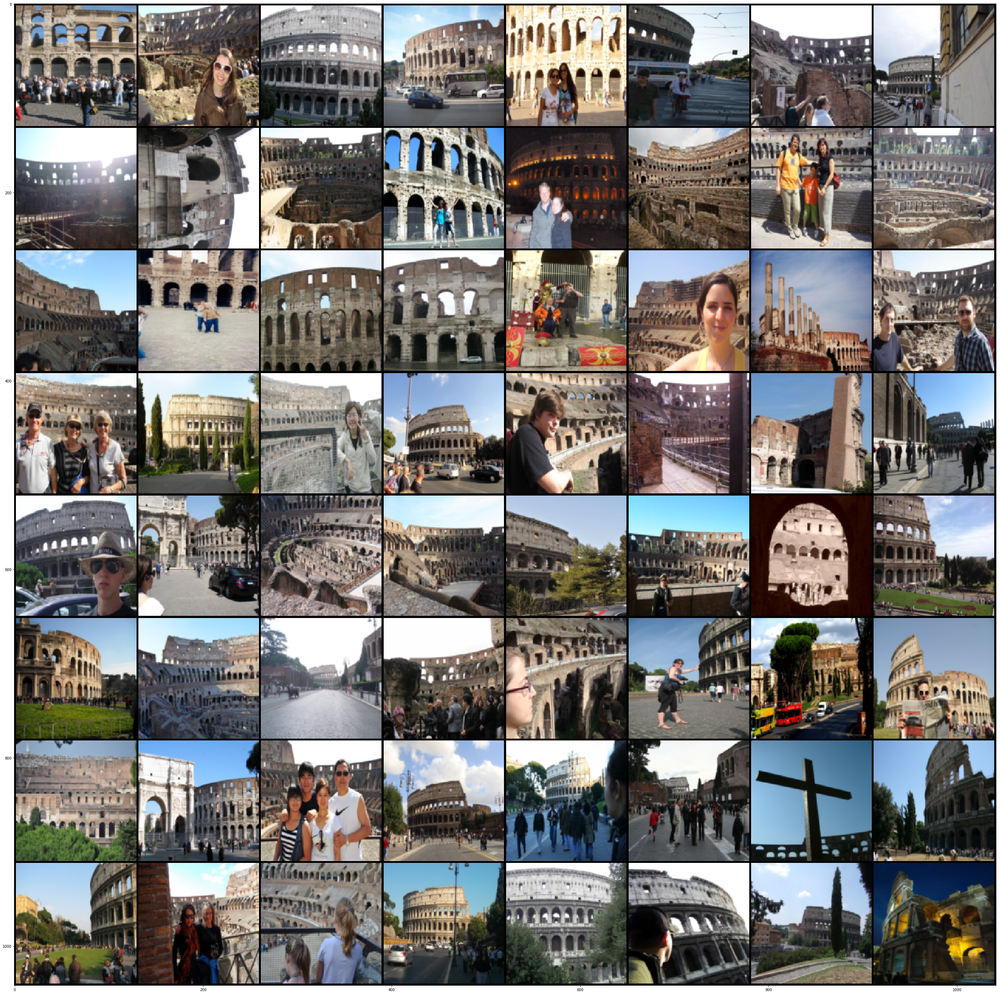

In [28]:
showDataInClass(6051)

The Colosseum

2967it [00:23, 123.97it/s]


Got 64 train picture files with class 6599


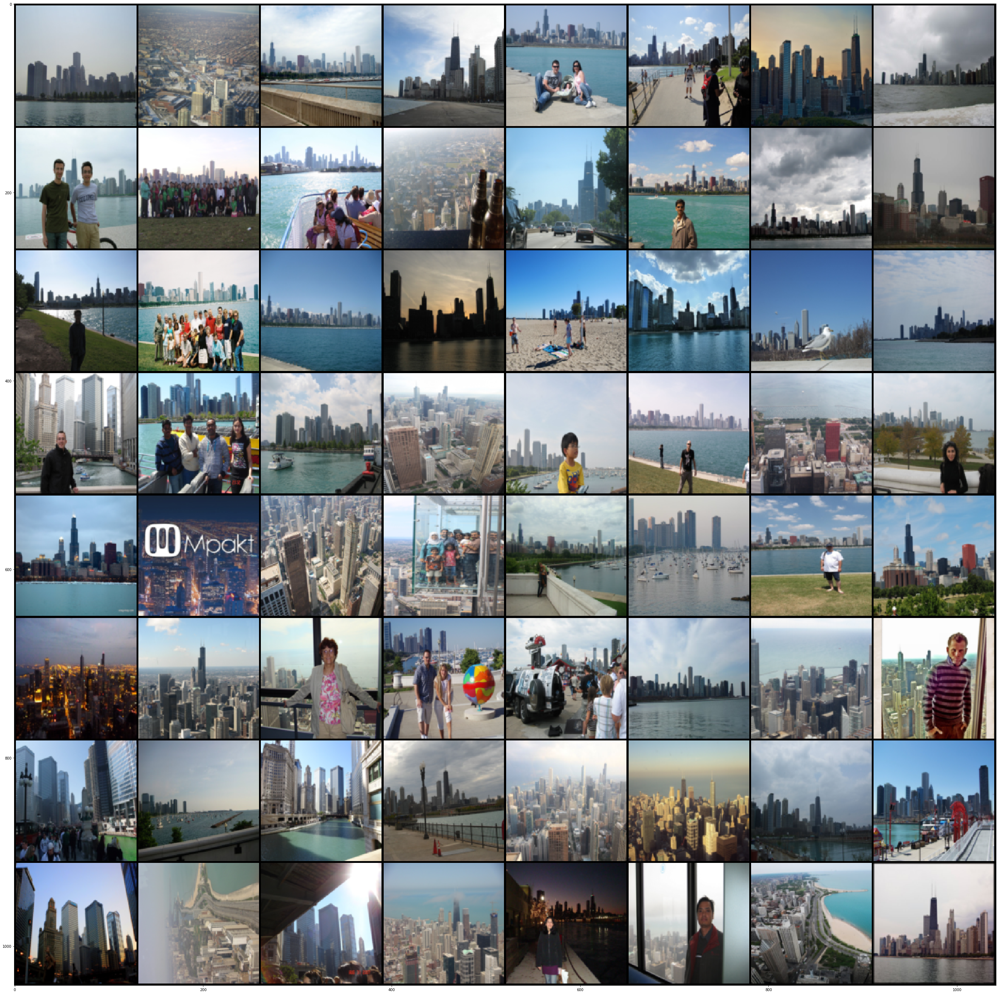

In [30]:
showDataInClass(6599)

Chicago Urban Area

4094it [00:23, 170.84it/s]


Got 64 train picture files with class 9779


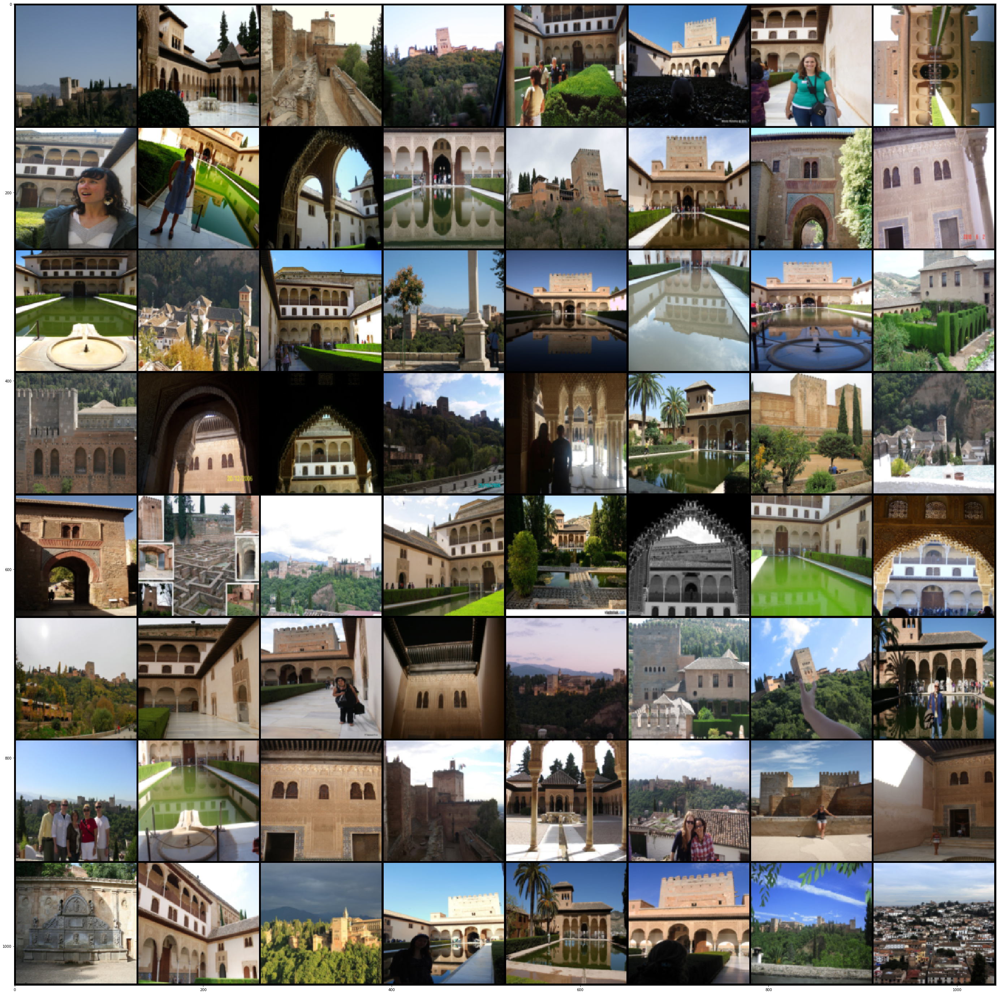

In [31]:
showDataInClass(9779)

The Alhambra Palace

1225030it [00:04, 286506.05it/s]


Got 1 train picture files with class 8232


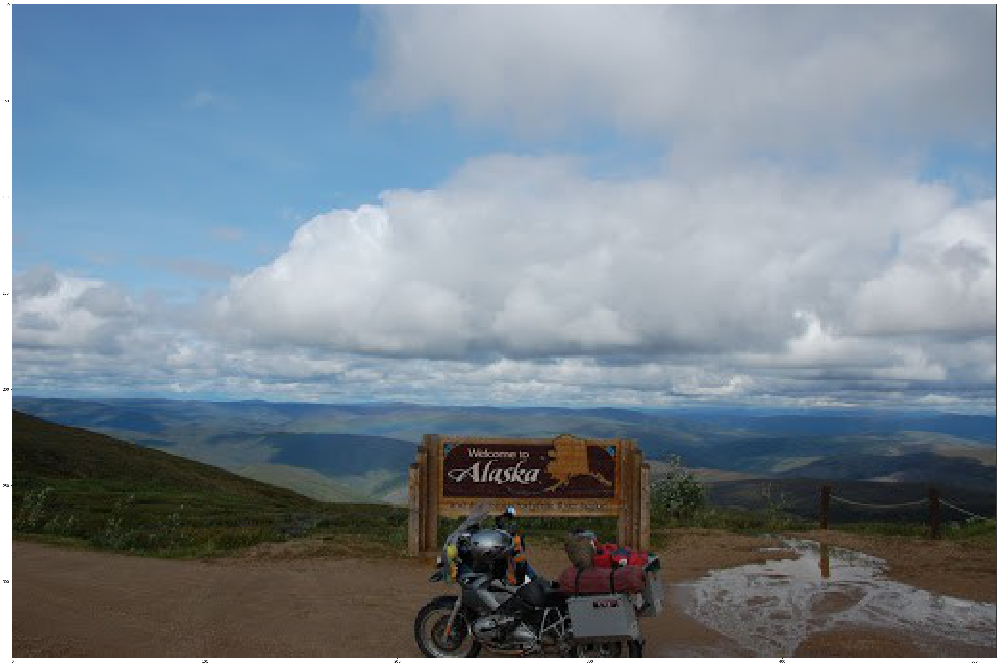

In [27]:
showDataInClass(8232)

1225030it [00:04, 268913.50it/s]


Got 1 train picture files with class 320


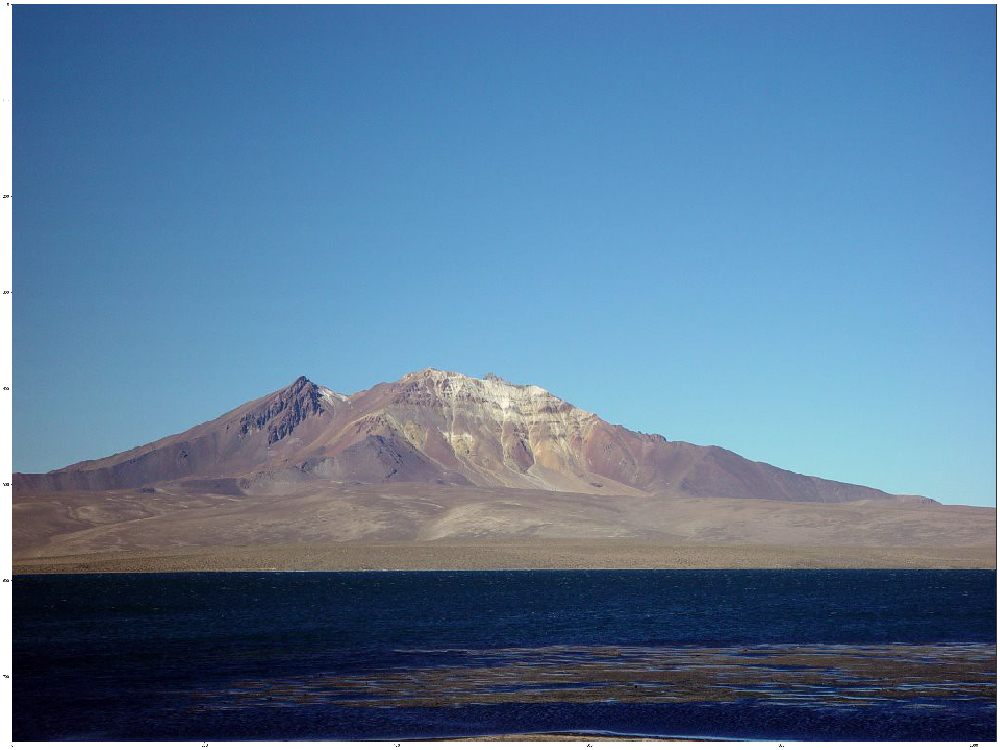

In [26]:
showDataInClass(320)

1225030it [00:04, 301639.32it/s]


Got 1 train picture files with class 12452


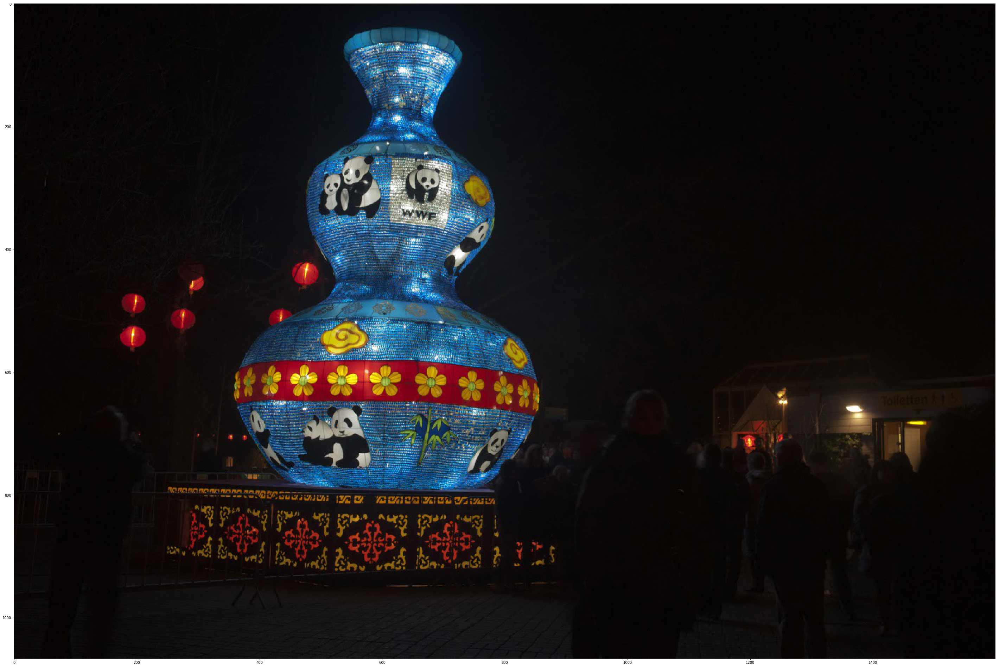

In [22]:
showDataInClass(12452)

What is this?

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
import seaborn as sns
sns.set(color_codes=True)
plt.figure(figsize = (18, 12))

In [ ]:
sns.distplot(labelList)
plt.show()

In [ ]:
labelKeyList = list(labelMap.keys())
labelKeyList.sort()

labelSize = []
for k in labelMap.keys():
    labelSize.append(len(labelMap[k]))

In [ ]:
labelKeyList = labelKeyList[:10]
labelSize = labelSize[:10]

In [ ]:
plt.plot(labelKeyList, labelSize, 'ro')
plt.show()

In [ ]:
plt.bar(labelKeyList, labelSize, align='center')
plt.show()